# FeatureMAE Mix with RAE Decoder

Mix DINO patch tokens from the FeatureMAE pipeline, encode the mixed tokens with the MAE encoder, and decode them to images using the pretrained RAE decoder (no residual denoiser).

**Checkpoints used**
- FeatureMAE: `/orcd/scratch/orcd/010/jianggy/smt/RAE/results/feature_mae_vitb_accum_alltokens/checkpoint_799.pth`
- DINOv2 backbone + stats + decoder config: `/orcd/scratch/orcd/010/jianggy/smt/RAE`
- RAE decoder weights: `/orcd/scratch/orcd/010/jianggy/smt/RAE/models/decoders/dinov2/wReg_base/ViTXL_n08/model.pt`

In [1]:
from pathlib import Path
import sys
import math
import random

import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision import transforms
from torch.utils.data import DataLoader, TensorDataset

def find_src_root():
    cwd = Path.cwd()
    candidates = [cwd, cwd / "RAE"]
    for parent in cwd.parents:
        candidates.extend([parent, parent / "RAE"])
    for base in candidates:
        src = base / "src"
        if src.exists():
            return base, src
    raise RuntimeError("Could not locate 'src' directory. Run this notebook from the repo root or RAE/.")

repo_root, src_root = find_src_root()
if str(src_root) not in sys.path:
    sys.path.append(str(src_root))

from knn_restore import generate_mix_pairs, seed_everything
import dataloader
from feature_mae.model import FeatureMaskedAutoencoder
from stage1.decoders import GeneralDecoder
from transformers import AutoImageProcessor, Dinov2WithRegistersModel, AutoConfig

/orcd/scratch/orcd/010/jianggy/micromamba/envs/rae/lib/python3.12/site-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/orcd/scratch/orcd/010/jianggy/micromamba/envs/rae/lib/python3.12/site-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assign

/orcd/scratch/orcd/010/jianggy/micromamba/envs/rae/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
seed = 1912
seed_everything(seed)

batch_size = 16
num_workers = 4
corrupt_range = (0.30, 0.50)
max_val = 256  # tweak if you want more/less validation tokens
num_visualize = 24
mix_alpha = 0.5

external_rae_root = Path("/orcd/scratch/orcd/010/jianggy/smt/RAE")
featuremae_ckpt = external_rae_root / "results/feature_mae_vitb_accum_alltokens/checkpoint_799.pth"
dino_path = external_rae_root / "models/hf/facebook__dinov2-with-registers-base"
decoder_config_path = external_rae_root / "configs/decoder/ViTXL"
decoder_ckpt = external_rae_root / "models/decoders/dinov2/wReg_base/ViTXL_n08/model.pt"

IMAGENET_MEAN = torch.tensor((0.485, 0.456, 0.406)).view(1, 3, 1, 1)
IMAGENET_STD = torch.tensor((0.229, 0.224, 0.225)).view(1, 3, 1, 1)

In [3]:
clean_train_loader, clean_val_loader = dataloader.get_imagenette_loaders(
    scheme="baseline",
    corrupt_range=None,
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=False,
)
corrupt_train_loader, corrupt_val_loader = dataloader.get_imagenette_loaders(
    scheme="occlude",
    corrupt_range=corrupt_range,
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=False,
)

class_names = list(clean_train_loader.dataset.classes)
print("Imagenette classes:", class_names)

def denormalize(batch: torch.Tensor) -> torch.Tensor:
    return (batch * IMAGENET_STD.to(batch) + IMAGENET_MEAN.to(batch)).clamp(0, 1)

Imagenette classes: ['n01440764', 'n02102040', 'n02979186', 'n03000684', 'n03028079', 'n03394916', 'n03417042', 'n03425413', 'n03445777', 'n03888257']


In [4]:
def load_featuremae_from_ckpt(ckpt_path: Path, device: torch.device):
    state = torch.load(ckpt_path, map_location="cpu")
    args = state.get("args", {})
    num_tokens = int(state["model"]["encoder_pos_embed"].shape[1] - 1)
    feature_dim = int(args.get("encoder_embed_dim", 768))
    model = FeatureMaskedAutoencoder(
        feature_dim=feature_dim,
        num_tokens=num_tokens,
        encoder_embed_dim=feature_dim,
        encoder_depth=int(args.get("encoder_depth", 12)),
        encoder_num_heads=int(args.get("encoder_heads", 12)),
        decoder_embed_dim=int(args.get("decoder_embed_dim", 512)),
        decoder_depth=int(args.get("decoder_depth", 8)),
        decoder_num_heads=int(args.get("decoder_heads", 16)),
    )
    incompatible = model.load_state_dict(state["model"], strict=False)
    if incompatible.missing_keys or incompatible.unexpected_keys:
        print("[FeatureMAE] Incompatible keys:", incompatible)
    model.to(device).eval()
    include_special = bool(args.get("include_special", False))
    return model, include_special


def load_rae_decoder(config_path: Path, checkpoint_path: Path, *, hidden_size: int, num_patches: int, device: torch.device):
    state = torch.load(checkpoint_path, map_location="cpu")
    patch_tokens = int(round((state["decoder_pred.weight"].shape[0] / 3) ** 0.5))
    decoder_config = AutoConfig.from_pretrained(config_path)
    decoder_config.hidden_size = hidden_size
    decoder_config.patch_size = patch_tokens
    decoder_config.image_size = decoder_config.patch_size * int(math.sqrt(num_patches))
    decoder = GeneralDecoder(decoder_config, num_patches=num_patches)
    missing, unexpected = decoder.load_state_dict(state, strict=False)
    if missing:
        print(f"[Decoder] Missing keys: {missing}")
    if unexpected:
        print(f"[Decoder] Unexpected keys: {unexpected}")
    decoder.to(device).eval()
    return decoder, patch_tokens


@torch.no_grad()
def extract_dino_tokens(
    dino: Dinov2WithRegistersModel,
    loader: DataLoader,
    device: torch.device,
    *,
    expected_tokens: int | None,
    include_special: bool,
    max_items: int | None = None,
):
    tokens = []
    labels = []
    seen = 0
    num_special = 1 + int(getattr(dino.config, "num_register_tokens", 0))
    for images, y in loader:
        images = images.to(device, non_blocking=True)
        out = dino(images, output_hidden_states=True)
        tok_full = out.last_hidden_state  # [B, 1+regs+patches, C]
        if include_special:
            tok = tok_full
        else:
            tok = tok_full[:, num_special:, :]
        if expected_tokens is not None and tok.size(1) > expected_tokens:
            tok = tok[:, :expected_tokens, :]
        tokens.append(tok.cpu())
        labels.append(y)
        seen += images.size(0)
        if max_items is not None and seen >= max_items:
            break
    return torch.cat(tokens, dim=0), torch.cat(labels, dim=0)


def to_patch_tokens(tokens: torch.Tensor, num_special: int) -> torch.Tensor:
    if num_special <= 0:
        return tokens
    return tokens[:, num_special:, :]


@torch.no_grad()
def featuremae_encode_tokens(tokens: torch.Tensor, featmae: FeatureMaskedAutoencoder, device: torch.device):
    tokens = tokens.to(device)
    expected = featmae.encoder_pos_embed.shape[1] - 1
    if tokens.size(1) != expected:
        tokens = tokens[:, :expected, :]
    pos = featmae.encoder_pos_embed[:, 1 : 1 + tokens.size(1), :].to(device)
    cls_token = (featmae.encoder_cls_token + featmae.encoder_pos_embed[:, :1, :]).to(device)
    cls_token = cls_token.expand(tokens.size(0), -1, -1)
    xseq = torch.cat([cls_token, tokens + pos], dim=1)
    xseq = featmae.encoder(xseq)
    xseq = featmae.encoder_norm(xseq)
    return xseq.cpu()


@torch.no_grad()
def featuremae_decode_tokens(encoded_tokens: torch.Tensor, featmae: FeatureMaskedAutoencoder, num_tokens: int):
    device = encoded_tokens.device
    ids_restore = torch.arange(num_tokens, device=device).unsqueeze(0).expand(encoded_tokens.size(0), -1)
    decoded = featmae.forward_decoder(encoded_tokens, ids_restore)
    return decoded


def select_diverse_rows(pair_labels: torch.Tensor, max_rows: int, seed: int):
    if pair_labels is None or max_rows <= 0:
        return None
    total = pair_labels.size(0)
    if total == 0:
        return None
    max_rows = min(max_rows, total)
    generator = torch.Generator().manual_seed(seed)
    order = torch.randperm(total, generator=generator)
    diverse = []
    seen = set()
    for idx in order.tolist():
        label_pair = tuple(sorted(int(x) for x in pair_labels[idx].tolist()))
        if label_pair in seen:
            continue
        seen.add(label_pair)
        diverse.append(idx)
        if len(diverse) == max_rows:
            break
    if len(diverse) < max_rows:
        for idx in order.tolist():
            if idx not in diverse:
                diverse.append(idx)
                if len(diverse) == max_rows:
                    break
    return torch.tensor(diverse[:max_rows], dtype=torch.long)


@torch.no_grad()
def decode_tokens(
    decoder: GeneralDecoder,
    tokens: torch.Tensor,
    *,
    dtype: torch.dtype | None,
    device: torch.device,
    image_mean: torch.Tensor,
    image_std: torch.Tensor,
    chunk: int = 4,
):
    target_dtype = dtype if dtype is not None else next(decoder.parameters()).dtype
    outputs = []
    for start in range(0, tokens.size(0), chunk):
        batch = tokens[start : start + chunk].to(device=device, dtype=target_dtype)
        logits = decoder(batch, drop_cls_token=False).logits
        pixels = decoder.unpatchify(logits)
        pixels = pixels * image_std.to(pixels.device) + image_mean.to(pixels.device)
        outputs.append(pixels.detach().clamp(0, 1).cpu())
    return torch.cat(outputs, dim=0)


In [5]:
dino_local = dino_path if dino_path.exists() else "facebook/dinov2-with-registers-base"
processor = AutoImageProcessor.from_pretrained(str(dino_local), local_files_only=isinstance(dino_local, Path))
dino = Dinov2WithRegistersModel.from_pretrained(str(dino_local), local_files_only=isinstance(dino_local, Path))
# Match Stage-1 RAE encoder: disable affine params on final LayerNorm
if hasattr(dino, "layernorm"):
    ln = dino.layernorm
    ln.elementwise_affine = False
    ln.weight = None
    ln.bias = None
dino.to(device).eval().requires_grad_(False)

featmae, include_special = load_featuremae_from_ckpt(featuremae_ckpt, device)
num_register_tokens = int(getattr(dino.config, "num_register_tokens", 0)) if include_special else 0
num_special_tokens = 1 + num_register_tokens if include_special else 0
expected_tokens = int(featmae.encoder_pos_embed.shape[1] - 1)
patch_tokens_per_image = expected_tokens - num_special_tokens
patch_grid = int(math.isqrt(patch_tokens_per_image))
print(f"FeatureMAE expected tokens: {expected_tokens} (patch grid {patch_grid}x{patch_grid}), include_special={include_special}")

rae_decoder, decoder_patch = load_rae_decoder(
    decoder_config_path,
    decoder_ckpt,
    hidden_size=featmae.feature_dim,
    num_patches=patch_tokens_per_image,
    device=device,
)
image_mean = torch.tensor(processor.image_mean).view(1, -1, 1, 1)
image_std = torch.tensor(processor.image_std).view(1, -1, 1, 1)
print(f"Decoder patch size: {decoder_patch}")


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


/orcd/scratch/orcd/010/jianggy/micromamba/envs/rae/lib/python3.12/site-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


FeatureMAE expected tokens: 261 (patch grid 16x16), include_special=True


Decoder patch size: 16


In [6]:
clean_valid_tokens, valid_labels = extract_dino_tokens(
    dino,
    clean_val_loader,
    device,
    expected_tokens=expected_tokens,
    include_special=include_special,
    max_items=max_val,
)
unique_labels = torch.unique(valid_labels)
if unique_labels.numel() < 2 and max_val is not None:
    print("Not enough class diversity in first max_val samples; reloading full validation set.")
    clean_valid_tokens, valid_labels = extract_dino_tokens(
        dino,
        clean_val_loader,
        device,
        expected_tokens=expected_tokens,
        include_special=include_special,
        max_items=None,
    )
    unique_labels = torch.unique(valid_labels)
print("Valid token tensor:", clean_valid_tokens.shape, "unique labels:", unique_labels.tolist())

encoded_valid_tokens = featuremae_encode_tokens(clean_valid_tokens, featmae, device)

mix_pair_generator = torch.Generator().manual_seed(seed + 1234)
mix_perm_valid, mix_pairs_valid = generate_mix_pairs(valid_labels, mix_pair_generator)
print("Mix pairs available:", None if mix_perm_valid is None else mix_perm_valid.shape[0])


Not enough class diversity in first max_val samples; reloading full validation set.


Valid token tensor: torch.Size([3925, 261, 768]) unique labels: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


Mix pairs available: 3925


In [7]:
if mix_perm_valid is None:
    raise RuntimeError(f"Need at least two classes to form mix pairs (unique labels={unique_labels.tolist()}).")

total_pairs = mix_perm_valid.size(0)
target = min(num_visualize, total_pairs)
selection = None
if mix_pairs_valid is not None:
    selection = select_diverse_rows(mix_pairs_valid, target, seed)
if selection is None:
    generator = torch.Generator().manual_seed(seed)
    selection = torch.randperm(total_pairs, generator=generator)[:target]

primary_indices = [int(x) for x in selection.tolist()]
partner_indices = [int(mix_perm_valid[i]) for i in primary_indices]

mix_enc = mix_alpha * encoded_valid_tokens[selection] + (1.0 - mix_alpha) * encoded_valid_tokens[mix_perm_valid[selection]]
decoded_mix_tokens = featuremae_decode_tokens(mix_enc.to(device), featmae, expected_tokens).cpu()
mix_recon_patch_tokens = to_patch_tokens(decoded_mix_tokens[:, 1:, :], num_special_tokens)

mix_pair_labels_plot = mix_pairs_valid[selection].cpu().tolist() if mix_pairs_valid is not None else None
num_recon = mix_recon_patch_tokens.size(0)
print(f"Prepared {num_recon} mixed pairs for decoding (all-token mix)")


Prepared 24 mixed pairs for decoding (all-token mix)


Decoded 8 direct DINO tokens -> RAE images


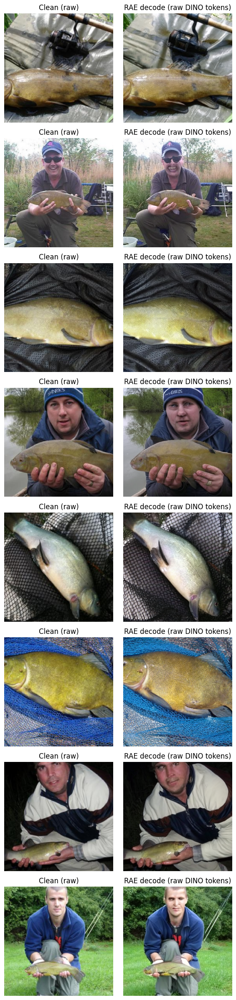

In [8]:
num_raw_recon = min(8, clean_valid_tokens.size(0))
raw_patch_tokens = to_patch_tokens(clean_valid_tokens[:num_raw_recon], num_special_tokens)
decoder_dtype = next(rae_decoder.parameters()).dtype
raw_rae_pixels = decode_tokens(
    rae_decoder,
    raw_patch_tokens,
    dtype=decoder_dtype,
    device=device,
    image_mean=image_mean,
    image_std=image_std,
    chunk=4,
)
raw_clean_images = []
count = 0
for clean_batch, _ in clean_val_loader:
    clean_denorm = denormalize(clean_batch)
    for b in range(clean_batch.size(0)):
        raw_clean_images.append(clean_denorm[b].cpu())
        count += 1
        if count >= num_raw_recon:
            break
    if count >= num_raw_recon:
        break
print(f"Decoded {num_raw_recon} direct DINO tokens -> RAE images")

columns_raw = ["Clean (raw)", "RAE decode (raw DINO tokens)"]
fig, axes = plt.subplots(num_raw_recon, len(columns_raw), figsize=(3 * len(columns_raw), 3 * num_raw_recon))
if num_raw_recon == 1:
    axes = axes[None, :]
for row in range(num_raw_recon):
    images = [raw_clean_images[row], raw_rae_pixels[row]]
    for col in range(len(columns_raw)):
        axes[row, col].imshow(images[col].permute(1, 2, 0).numpy())
        axes[row, col].set_title(columns_raw[col])
        axes[row, col].axis("off")
plt.tight_layout()


In [9]:
needed_indices = set(primary_indices + partner_indices)
clean_cache = {}
current_idx = 0
for clean_batch, _ in clean_val_loader:
    clean_denorm = denormalize(clean_batch)
    for b in range(clean_batch.size(0)):
        if current_idx in needed_indices:
            clean_cache[current_idx] = clean_denorm[b].cpu()
            if len(clean_cache) == len(needed_indices):
                break
        current_idx += 1
    if len(clean_cache) == len(needed_indices):
        break

source_a_clean = [clean_cache[idx] for idx in primary_indices]
source_b_clean = [clean_cache[idx] for idx in partner_indices]


In [10]:
decoder_dtype = next(rae_decoder.parameters()).dtype
mix_recon_pixels = decode_tokens(
    rae_decoder,
    mix_recon_patch_tokens,
    dtype=decoder_dtype,
    device=device,
    image_mean=image_mean,
    image_std=image_std,
    chunk=4,
)


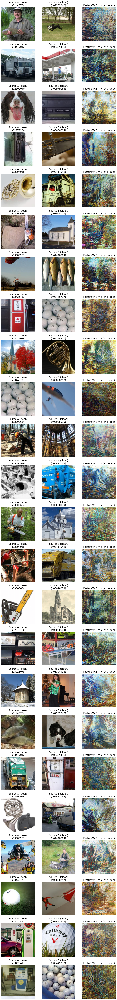

In [11]:
columns = [
    "Source A (clean)",
    "Source B (clean)",
    "FeatureMAE mix (enc→dec)",
]
num_cols = len(columns)
fig, axes = plt.subplots(num_recon, num_cols, figsize=(3 * num_cols, 3 * num_recon))
if num_recon == 1:
    axes = axes[None, :]
row_pairs = mix_pair_labels_plot if mix_pair_labels_plot is not None else None

for row in range(num_recon):
    if row_pairs and row < len(row_pairs):
        class_a = class_names[row_pairs[row][0]]
        class_b = class_names[row_pairs[row][1]]
    else:
        class_a = "class A"
        class_b = "class B"

    images = [
        source_a_clean[row],
        source_b_clean[row],
        mix_recon_pixels[row],
    ]

    for col in range(num_cols):
        axes[row, col].imshow(images[col].permute(1, 2, 0).numpy())
        if col == 0:
            axes[row, col].set_title(f"{columns[col]}\n({class_a})")
        elif col == 1:
            axes[row, col].set_title(f"{columns[col]}\n({class_b})")
        else:
            axes[row, col].set_title(columns[col])
        axes[row, col].axis("off")

plt.tight_layout()
